In [ ]:
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sb

#sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
#sc.logging.print_versions()
sc.logging.print_header()

from matplotlib import rcParams

import matplotlib
import matplotlib.pyplot as plt
matplotlib.style.use('default')  


In [2]:
sc.settings.set_figure_params(dpi=80)

# Object after scrublet 

In [3]:
#----- After scrublet, before filtration  
adata_Scrublet=sc.read('../H5AD/pCov40_AS_BF_04132021.h5ad')
adata_Scrublet


AnnData object with n_obs × n_vars = 300708 × 33538
    obs: 'Cells', 'Samples', 'IDs', 'Names', 'Fig_ids', 'Groups', 'Ethnicity', 'Age_Months', 'runs_10X', 'Year', 'Patient_groups', 'doublet_score', 'predicted_doublets_1'
    var: 'gene_ids', 'feature_types'

In [4]:
adata_Scrublet.obs.head()

,Cells,Samples,IDs,Names,Fig_ids,Groups,Ethnicity,Age_Months,runs_10X,Year,Patient_groups,doublet_score,predicted_doublets_1
AAACCCAAGAACTGAT-1,AAACCCAAGAACTGAT-1,1,JB19050,HPIR_021_1,pHC1,pHC,W,2.17,B1,2020,pHC,0.172450,singlet
AAACCCAAGCGGGTTA-1,AAACCCAAGCGGGTTA-1,1,JB19050,HPIR_021_1,pHC1,pHC,W,2.17,B1,2020,pHC,0.041903,singlet
AAACCCAAGTGTAGAT-1,AAACCCAAGTGTAGAT-1,1,JB19050,HPIR_021_1,pHC1,pHC,W,2.17,B1,2020,pHC,0.037089,singlet
AAACCCACAACAAAGT-1,AAACCCACAACAAAGT-1,1,JB19050,HPIR_021_1,pHC1,pHC,W,2.17,B1,2020,pHC,0.102319,singlet
AAACCCACACGACAGA-1,AAACCCACACGACAGA-1,1,JB19050,HPIR_021_1,pHC1,pHC,W,2.17,B1,2020,pHC,0.116209,singlet


In [5]:
#adata_Scrublet.obs['IDs'].value_counts(sort=False).filter(like='JB20', axis=0)

In [6]:
adata_Scrublet.obs.IDs.value_counts(sort=False)

JB19050     6686
JB19053     9891
JB19056     7640
JB19057    12814
JB19058     4930
JB19066     4239
JB19069     5361
JB20064     5579
JB20065     3163
JB20066     5386
JB20067     8229
JB20068     6551
JB20076     8642
JB20077     6134
JB20078     6482
JB20079     6144
JB20080     6586
JB20120     6466
JB20121     5066
JB20127     5999
JB20136     7937
JB20137     6311
JB20138     6534
JB20143     7279
JB21097     9340
JB21098     6504
JB21099     5306
JB21100     7725
JB21101    13560
JB21102     8750
JB21103    10475
JB21104     9122
JB21113     6918
JB21114    10450
JB21115     9161
JB21116     5223
JB21117    10629
JB21118     8445
JB21119    10395
JB21120     8656
Name: IDs, dtype: int64

# Highly variable genes (HVG)

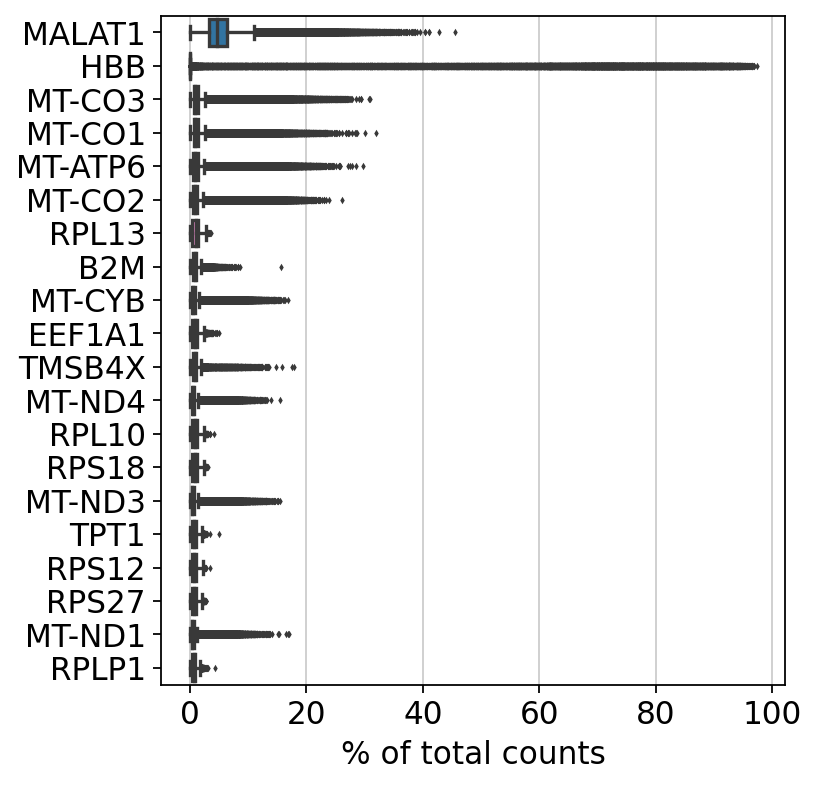

In [7]:
adata_Scrublet.var_names_make_unique()
sc.pl.highest_expr_genes(adata_Scrublet, n_top=20)

# Filter out cells based on number of cells and min genes detected per cell

In [8]:
sc.pp.filter_cells(adata_Scrublet, min_genes=400) #***
sc.pp.filter_genes(adata_Scrublet, min_cells=3)

/home/nehard/anaconda3/envs/scanpy1_6/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [9]:
adata_Scrublet

AnnData object with n_obs × n_vars = 268757 × 25259
    obs: 'Cells', 'Samples', 'IDs', 'Names', 'Fig_ids', 'Groups', 'Ethnicity', 'Age_Months', 'runs_10X', 'Year', 'Patient_groups', 'doublet_score', 'predicted_doublets_1', 'n_genes'
    var: 'gene_ids', 'feature_types', 'n_cells'

In [10]:
#-----------  After filtration

adata_Scrublet.obs.to_csv('../Meta/pCov40_AS_AF_03252021.csv')
#-- H5ad object 
adata_Scrublet.write('../H5AD/pCov40_AS_AF_03252021.h5ad')


/home/nehard/anaconda3/envs/scanpy1_6/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


In [11]:
!pwd

/projects/banchereau-lab/USERS/nehard/SingleCell/Jupyter/Covid/pCov_2021/NoteBooks


In [12]:
#adata_Scrublet.obs.to_csv('./Meta_72samples/Meta_LifeSpan_BS_100419.csv')

In [13]:
adata_Scrublet

AnnData object with n_obs × n_vars = 268757 × 25259
    obs: 'Cells', 'Samples', 'IDs', 'Names', 'Fig_ids', 'Groups', 'Ethnicity', 'Age_Months', 'runs_10X', 'Year', 'Patient_groups', 'doublet_score', 'predicted_doublets_1', 'n_genes'
    var: 'gene_ids', 'feature_types', 'n_cells'

# Filter out cells based on MT contents and n counts 

In [14]:
mito_genes = adata_Scrublet.var_names.str.startswith('MT-')
# for each cell compute fraction of counts in mito genes vs. all genes
# the `.A1` is only necessary as X is sparse (to transform to a dense array after summing)
adata_Scrublet.obs['percent_mito'] = np.sum(
    adata_Scrublet[:, mito_genes].X, axis=1).A1 / np.sum(adata_Scrublet.X, axis=1).A1
# add the total counts per cell as observations-annotation to adata
adata_Scrublet.obs['n_counts'] = adata_Scrublet.X.sum(axis=1).A1


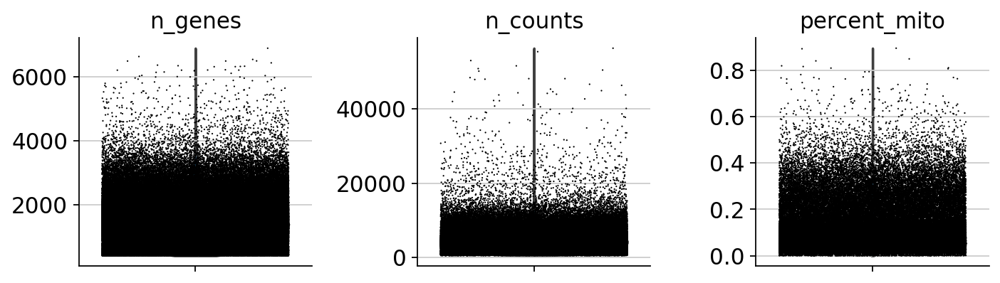

In [15]:
rcParams['figure.figsize'] = (5,5)
sc.pl.violin(adata_Scrublet, ['n_genes', 'n_counts', 'percent_mito'],
             jitter=0.4, multi_panel=True)

/home/nehard/anaconda3/envs/scanpy1_6/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


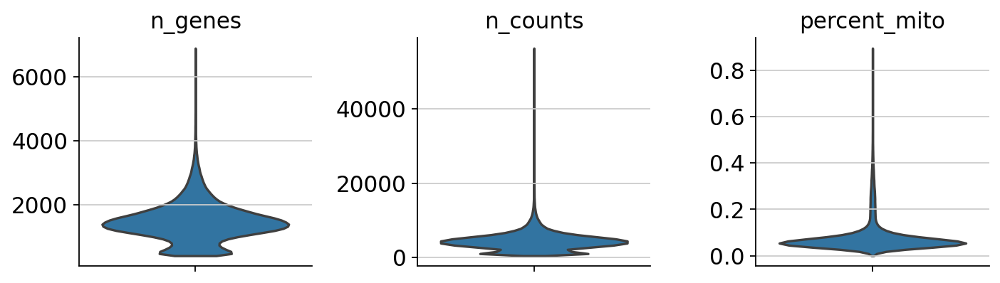

In [16]:
rcParams['figure.figsize'] = (5,5)
sc.pl.violin(adata_Scrublet, ['n_genes', 'n_counts', 'percent_mito'], 
             size=0,
             jitter=0.4, 
             multi_panel=True)

/home/nehard/anaconda3/envs/scanpy1_6/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


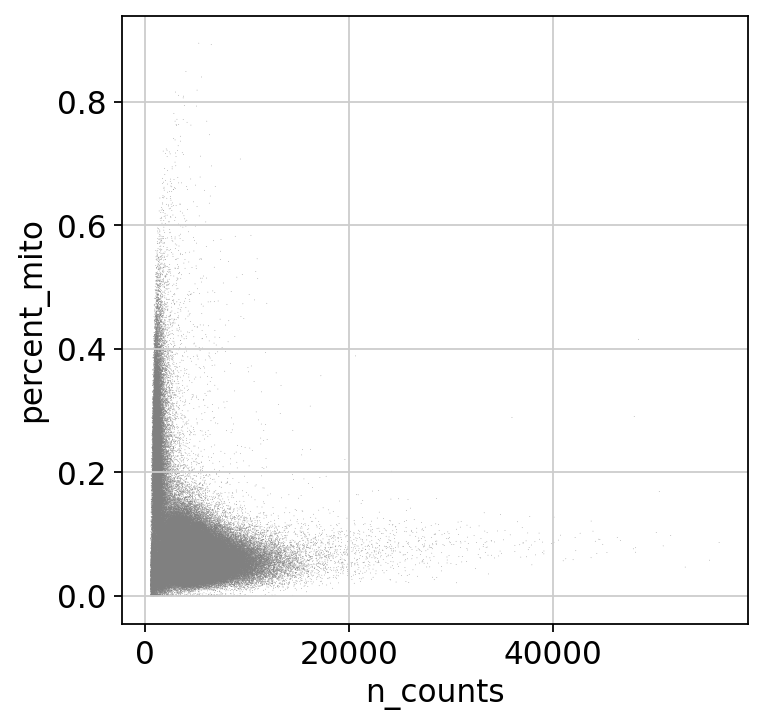

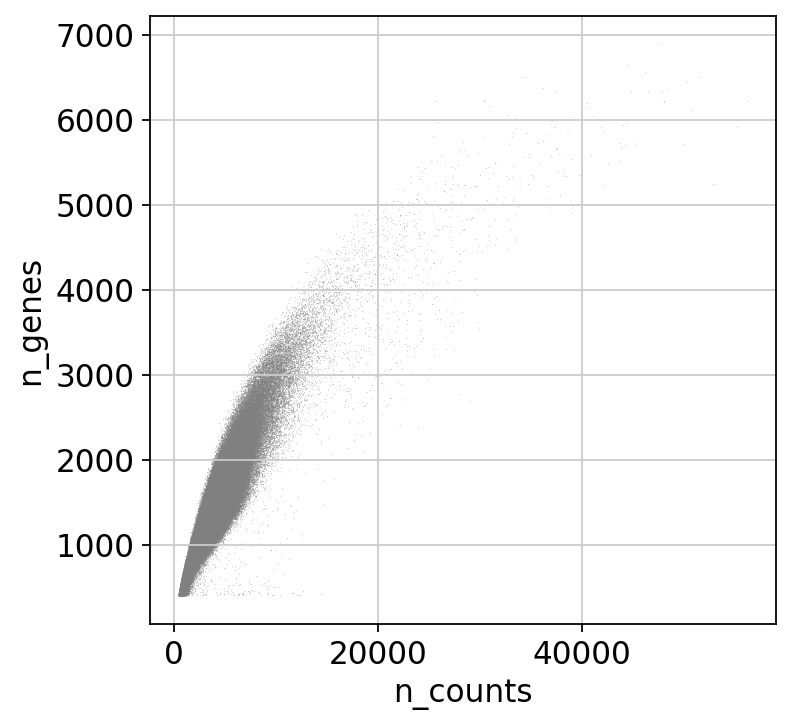

In [17]:
#pct_counts_mito:percent_mito
#total_features_by_counts:n_genes
#total_counts: n_counts
sc.pl.scatter(adata_Scrublet, x='n_counts', y='percent_mito')
sc.pl.scatter(adata_Scrublet, x='n_counts', y='n_genes')

In [18]:
#-----------  After filtration
adata_Scrublet.obs.to_csv('../Meta/pCov40_AS_AF_03252021.csv')
#-- H5ad object 
adata_Scrublet.write('../H5AD/pCov40_AS_AF_03252021.h5ad')


In [19]:
adata_Scrublet=sc.read('../H5AD/pCov40_AS_AF_03252021.h5ad')
adata_Scrublet

AnnData object with n_obs × n_vars = 268757 × 25259
    obs: 'Cells', 'Samples', 'IDs', 'Names', 'Fig_ids', 'Groups', 'Ethnicity', 'Age_Months', 'runs_10X', 'Year', 'Patient_groups', 'doublet_score', 'predicted_doublets_1', 'n_genes', 'percent_mito', 'n_counts'
    var: 'gene_ids', 'feature_types', 'n_cells'

# Actually do the Filtering 

In [20]:
#-- filtering: number of genes and % mito
adata_Scrublet = adata_Scrublet[adata_Scrublet.obs['n_genes'] < 4500, :]
adata_Scrublet = adata_Scrublet[adata_Scrublet.obs['percent_mito'] < 0.25, :] #-- 20% mito 
adata_Scrublet

/home/nehard/anaconda3/envs/scanpy1_6/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/nehard/anaconda3/envs/scanpy1_6/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


View of AnnData object with n_obs × n_vars = 256766 × 25259
    obs: 'Cells', 'Samples', 'IDs', 'Names', 'Fig_ids', 'Groups', 'Ethnicity', 'Age_Months', 'runs_10X', 'Year', 'Patient_groups', 'doublet_score', 'predicted_doublets_1', 'n_genes', 'percent_mito', 'n_counts'
    var: 'gene_ids', 'feature_types', 'n_cells'

In [21]:
adata_Scrublet

View of AnnData object with n_obs × n_vars = 256766 × 25259
    obs: 'Cells', 'Samples', 'IDs', 'Names', 'Fig_ids', 'Groups', 'Ethnicity', 'Age_Months', 'runs_10X', 'Year', 'Patient_groups', 'doublet_score', 'predicted_doublets_1', 'n_genes', 'percent_mito', 'n_counts'
    var: 'gene_ids', 'feature_types', 'n_cells'

In [22]:
#-- save meta after mito + number genes filtration
adata_Scrublet.obs.to_csv('../Meta/pCov40_AF_AM_03252021.csv')
#-- H5ad object 
adata_Scrublet.write('../H5AD/pCov40_AF_AM_03252021.h5ad')


/home/nehard/anaconda3/envs/scanpy1_6/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


# Normalization-Logarithmize-HVG- scale the data

In [23]:
#---  Total-count normalize (library-size correct)  the data matrix X, so that counts become comparable among cells.
sc.pp.normalize_per_cell(adata_Scrublet, counts_per_cell_after=1e4)

#--- Logarithmize the data
sc.pp.log1p(adata_Scrublet)


Trying to set attribute `.obs` of view, copying.


In [24]:
#Set the .raw attribute of AnnData object to the normalized and logarithmized raw gene expression for later use in differential testing and visualizations of gene expression. 
#This simply freezes the state of the AnnData object.

adata_Scrublet.raw = adata_Scrublet

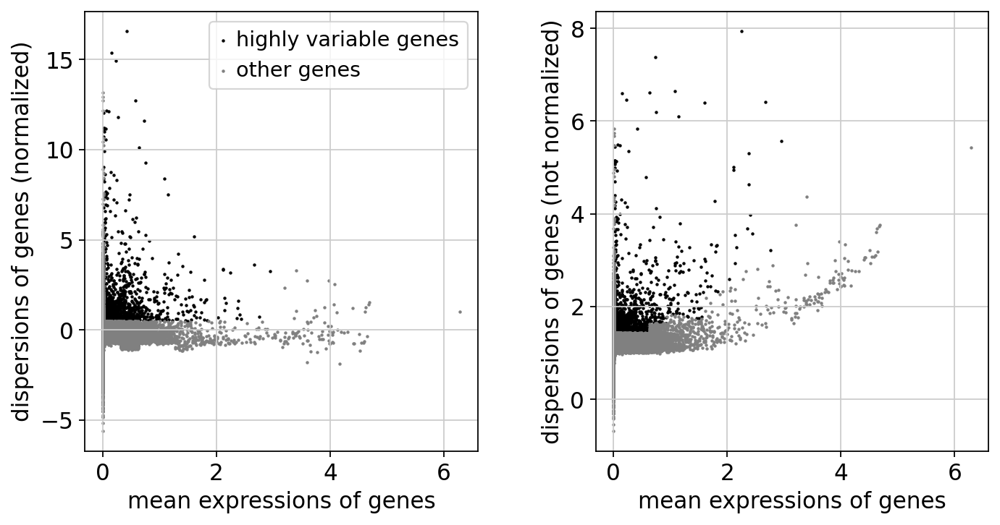

In [25]:
#-- Identify highly-variable genes (HVG)
sc.pp.highly_variable_genes(adata_Scrublet, min_mean=0.0125, max_mean=3, min_disp=0.5)

#-- plot HVG
sc.pl.highly_variable_genes(adata_Scrublet)

In [26]:
#-- Actually do the filtering
adata_Scrublet = adata_Scrublet[:, adata_Scrublet.var['highly_variable']]

/home/nehard/anaconda3/envs/scanpy1_6/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


# Scale

In [27]:
#-- Scale each gene to unit variance. Clip values exceeding standard deviation 10.
sc.pp.scale(adata_Scrublet, max_value=10)


/home/nehard/anaconda3/envs/scanpy1_6/lib/python3.6/site-packages/scanpy/preprocessing/_simple.py:806: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


# Run Principal component analysis

/home/nehard/anaconda3/envs/scanpy1_6/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


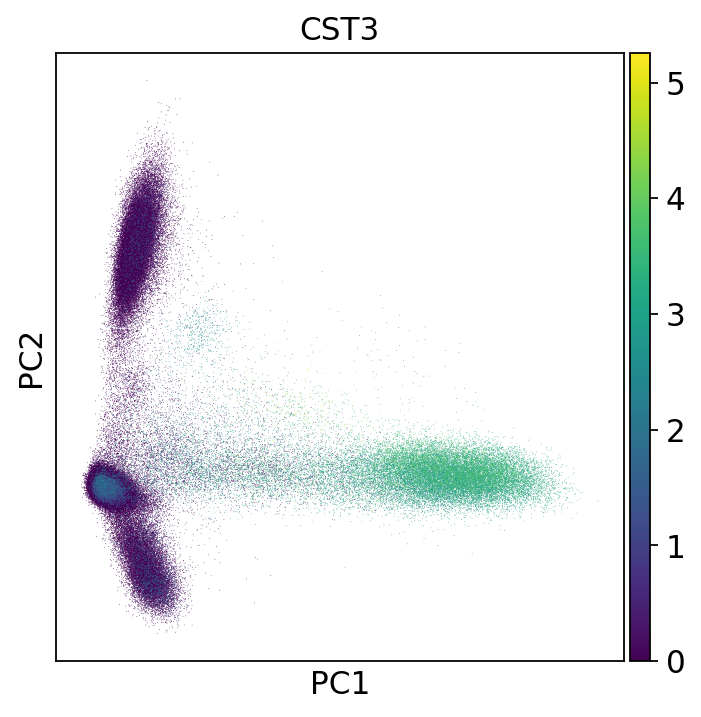

In [28]:
#-- Principal component analysis
sc.tl.pca(adata_Scrublet, svd_solver='arpack')
sc.pl.pca(adata_Scrublet, color='CST3')


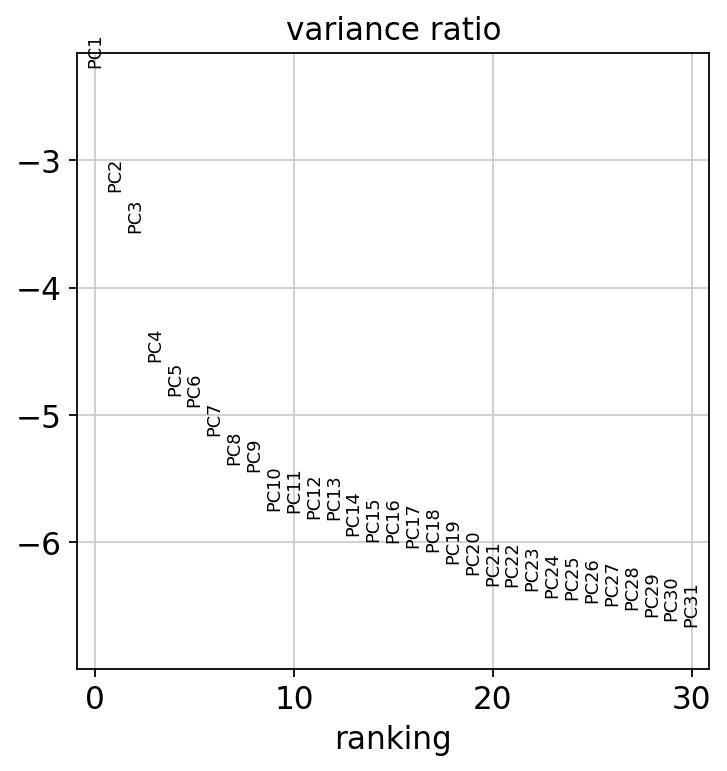

In [29]:
sc.pl.pca_variance_ratio(adata_Scrublet, log=True)


In [30]:
adata_Scrublet.write('../H5AD/pCov40_AS_BC_03252021.h5ad')
adata_Scrublet

AnnData object with n_obs × n_vars = 256766 × 1362
    obs: 'Cells', 'Samples', 'IDs', 'Names', 'Fig_ids', 'Groups', 'Ethnicity', 'Age_Months', 'runs_10X', 'Year', 'Patient_groups', 'doublet_score', 'predicted_doublets_1', 'n_genes', 'percent_mito', 'n_counts'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

# Computing the neighborhood graph

In [31]:
#------  Computing the neighborhood graph
sc.pp.neighbors(adata_Scrublet, n_neighbors=10, n_pcs=40) #parallel=False
sc.logging.print_memory_usage()

Memory usage: current 17.89 GB, difference +17.89 GB


In [32]:
!pwd

/projects/banchereau-lab/USERS/nehard/SingleCell/Jupyter/Covid/pCov_2021/NoteBooks


In [33]:
adata_Scrublet

AnnData object with n_obs × n_vars = 256766 × 1362
    obs: 'Cells', 'Samples', 'IDs', 'Names', 'Fig_ids', 'Groups', 'Ethnicity', 'Age_Months', 'runs_10X', 'Year', 'Patient_groups', 'doublet_score', 'predicted_doublets_1', 'n_genes', 'percent_mito', 'n_counts'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors'
    obsm: 'X_pca'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

# Embedding the neighborhood graph - UMAP 

In [34]:
#------  Embedding the neighborhood graph : Run UMAP
sc.tl.umap(adata_Scrublet, n_components=3)


In [35]:
#-- Embedding the neighborhood graph: Run Umap on paga 
# In some ocassions, you might still observe disconnected clusters and similar connectivity violations. They can usually be remedied by running:
#tl.paga(adata)
#pl.paga(adata, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
#tl.umap(adata, init_pos='paga')

/home/nehard/anaconda3/envs/scanpy1_6/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


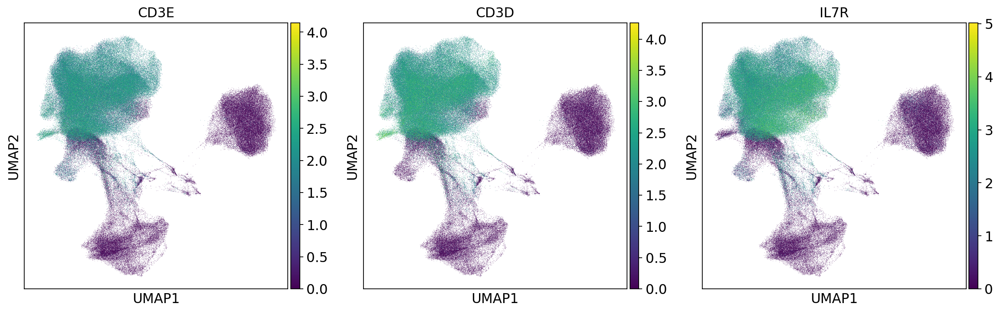

In [36]:
#-- plot the scaled and corrected gene expression
from matplotlib import rcParams
rcParams['figure.figsize'] = (5,5)
sc.pl.umap(adata_Scrublet, color=['CD3E','CD3D', 'IL7R'], use_raw=True)


# Clustering the neighborhood graph: leiden clustering 

In [37]:
#- Clustering the single-cell graph
sc.tl.leiden(adata_Scrublet, resolution=1.2, key_added='Res1_2_BC')

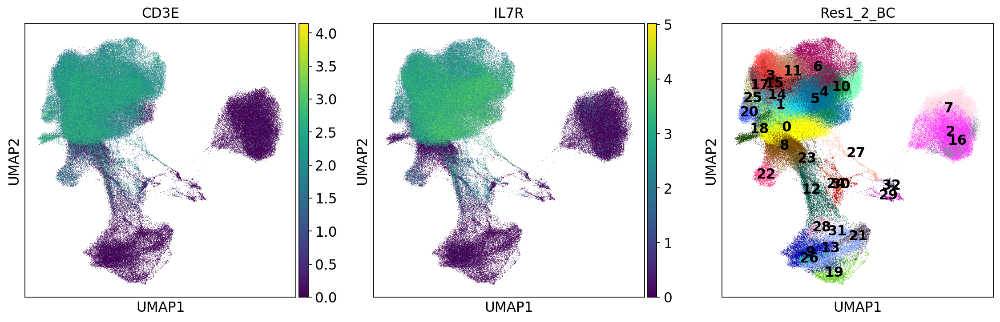

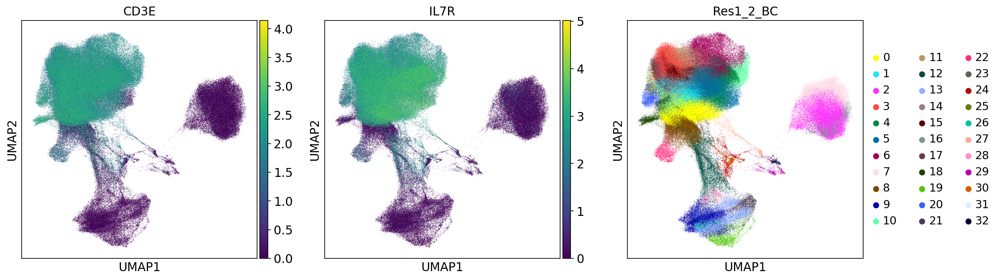

In [40]:
rcParams['figure.figsize'] = (5,5)
sc.pl.umap(adata_Scrublet, color=['CD3E', 'IL7R','Res1_2_BC'], edgecolor='none', size=1, show=True, linewidths=10,legend_loc='on data')
sc.pl.umap(adata_Scrublet, color=['CD3E', 'IL7R','Res1_2_BC'], edgecolor='none', size=1, show=True, linewidths=10)

In [41]:
adata_Scrublet

AnnData object with n_obs × n_vars = 256766 × 1362
    obs: 'Cells', 'Samples', 'IDs', 'Names', 'Fig_ids', 'Groups', 'Ethnicity', 'Age_Months', 'runs_10X', 'Year', 'Patient_groups', 'doublet_score', 'predicted_doublets_1', 'n_genes', 'percent_mito', 'n_counts', 'Res1_2_BC'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'Res1_2_BC_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [42]:
adata_Scrublet.write('../H5AD/pCov40_BC_03252021.h5ad')

In [6]:
#-- -colors for DCs
col_ids =['tomato','paleturquoise','cornflowerblue','mediumseagreen','mediumpurple',
          'goldenrod','lightgreen','palevioletred','lightsalmon','thistle', #0-9
          "brown","plum","lightskyblue","yellowgreen","mediumorchid","mediumturquoise","peru",
          "#bf812d","mediumaquamarine","lightslategrey","dodgerblue","#4daf4a",'#377eb8']

col_groups=["#66c2a4","#9e9ac8"]

In [44]:
adata_Scrublet.uns['Res1_2_BC_colors']=col_ids
adata_Scrublet.uns['runs_10X_colors']=col_ids
adata_Scrublet.uns['Year_colors']=col_groups


/home/nehard/anaconda3/envs/scanpy1_6/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


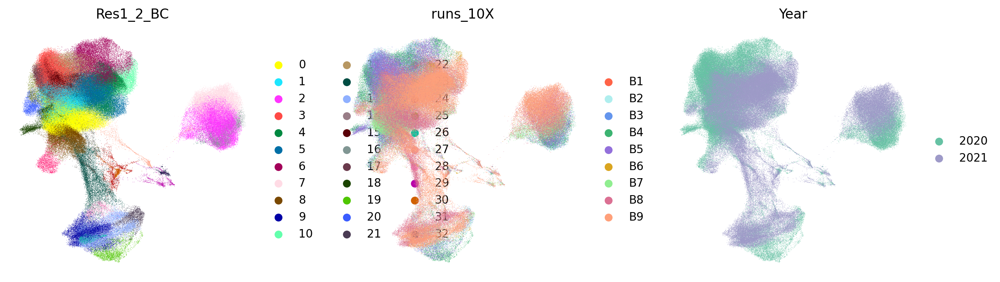

In [45]:
matplotlib.style.use('default')   
rcParams['figure.figsize'] = (4,4)

genes=['Res1_2_BC','runs_10X','Year']

sc.pl.umap(adata_Scrublet, 
           color=genes,
           size=0.5, 
           color_map='OrRd',
           ncols=4,
           frameon=False)

# Save embeddings BEFORE CORRECTION

In [46]:
#--- Umap embbedings 
Emb =adata_Scrublet.obsm.to_df()[['X_umap1', 'X_umap2', 'X_umap3']]
Emb.index =adata_Scrublet.obs.index

#-- Meta Data 
meta =adata_Scrublet.obs
Mat = meta.join(Emb)

Mat.to_csv('../Meta/pCov40_AS_AF_BC_03252021.csv')
adata_Scrublet.write('../H5AD/pCov40_BC_03252021.h5ad')


In [47]:
adata_Scrublet

AnnData object with n_obs × n_vars = 256766 × 1362
    obs: 'Cells', 'Samples', 'IDs', 'Names', 'Fig_ids', 'Groups', 'Ethnicity', 'Age_Months', 'runs_10X', 'Year', 'Patient_groups', 'doublet_score', 'predicted_doublets_1', 'n_genes', 'percent_mito', 'n_counts', 'Res1_2_BC'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'Res1_2_BC_colors', 'runs_10X_colors', 'Year_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

# 10X runs Before bbknn batch correction 

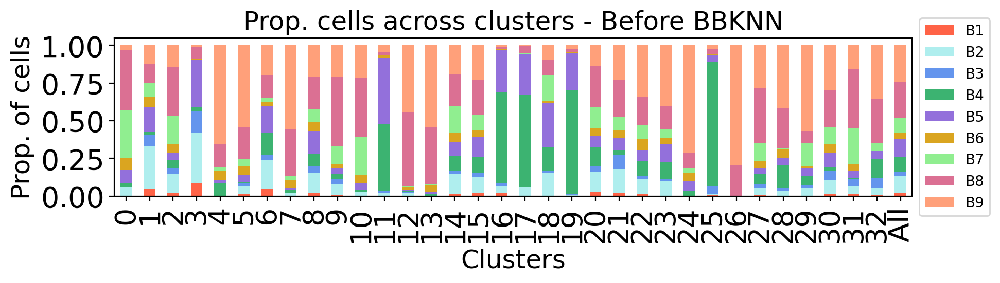

In [56]:
#-- proportion table
Groups_tab = pd.crosstab(index=adata_Scrublet.obs['Res1_2_BC'],  # Make a crosstab
                        columns=adata_Scrublet.obs['runs_10X'], margins=True)  

MyTab= Groups_tab.div(Groups_tab["All"], axis=0)
MyTab2 = MyTab.drop(columns="All")

MyTab2.plot(kind="bar",
            figsize=(10,2),
            stacked=True, 
            linewidth=1, 
            width=0.5, 
            fontsize=20, 
            color=col_ids)


plt.title("Prop. cells across clusters - Before BBKNN", fontsize=18)
plt.ylabel("Prop. of cells", fontsize=18)
plt.xlabel("Clusters", fontsize=18)
plt.ylim=1.0

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=10)
plt.show()


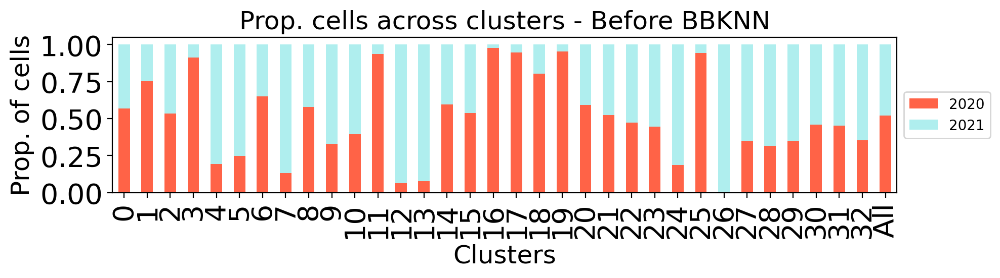

In [57]:
#-- proportion table
Groups_tab = pd.crosstab(index=adata_Scrublet.obs['Res1_2_BC'],  # Make a crosstab
                        columns=adata_Scrublet.obs['Year'], margins=True)               # Name the count column

MyTab= Groups_tab.div(Groups_tab["All"], axis=0)
MyTab2 = MyTab.drop(columns="All")

MyTab2.plot(kind="bar",
            figsize=(10,2),
            stacked=True, 
            linewidth=1, 
            width=0.5, 
            fontsize=20, 
            color=col_ids)


plt.title("Prop. cells across clusters - Before BBKNN", fontsize=18)
plt.ylabel("Prop. of cells", fontsize=18)
plt.xlabel("Clusters", fontsize=18)
plt.ylim=1.0

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=10)
plt.show()


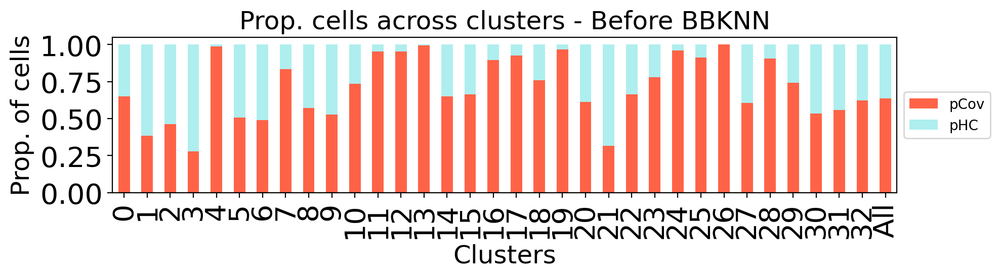

In [58]:
#-- proportion table
Groups_tab = pd.crosstab(index=adata_Scrublet.obs['Res1_2_BC'],  # Make a crosstab
                        columns=adata_Scrublet.obs['Groups'], margins=True)               # Name the count column

MyTab= Groups_tab.div(Groups_tab["All"], axis=0)
MyTab2 = MyTab.drop(columns="All")

MyTab2.plot(kind="bar",
            figsize=(10,2),
            stacked=True, 
            linewidth=1, 
            width=0.5, 
            fontsize=20, 
            color=col_ids)


plt.title("Prop. cells across clusters - Before BBKNN", fontsize=18)
plt.ylabel("Prop. of cells", fontsize=18)
plt.xlabel("Clusters", fontsize=18)
plt.ylim=1.0

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=10)
plt.show()


In [51]:
adata_Scrublet

AnnData object with n_obs × n_vars = 256766 × 1362
    obs: 'Cells', 'Samples', 'IDs', 'Names', 'Fig_ids', 'Groups', 'Ethnicity', 'Age_Months', 'runs_10X', 'Year', 'Patient_groups', 'doublet_score', 'predicted_doublets_1', 'n_genes', 'percent_mito', 'n_counts', 'Res1_2_BC'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'Res1_2_BC_colors', 'runs_10X_colors', 'Year_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [52]:
adata_Scrublet.obs['Year'].value_counts()

2020    133894
2021    122872
Name: Year, dtype: int64

In [53]:
#adata_Scrublet.obs['runs_10X'].value_counts()

In [ ]:
#adata_Scrublet=sc.read('../H5AD/')

# BBKNN BATCH CORRECTION FOR "YEARS"

In [59]:
import bbknn

corrected = bbknn.bbknn(adata_Scrublet, 
                        copy=True, 
                        batch_key="Year", 
                        metric="angular", 
                        approx=True,
                        #save_knn=True, 
                        neighbors_within_batch=5, 
                        n_pcs=20, 
                        trim=50)


# UMAP and clustering after BBKNN

In [60]:
#--- runing UMAP on corrected data 
sc.tl.umap(corrected, min_dist=0.3,n_components=3)

In [61]:
#--- Clustering the neighborhood graph: Leiden clustering on corrected data
sc.tl.leiden(corrected, resolution=1.2, key_added='Res1_2_AC') 

In [62]:
corrected

AnnData object with n_obs × n_vars = 256766 × 1362
    obs: 'Cells', 'Samples', 'IDs', 'Names', 'Fig_ids', 'Groups', 'Ethnicity', 'Age_Months', 'runs_10X', 'Year', 'Patient_groups', 'doublet_score', 'predicted_doublets_1', 'n_genes', 'percent_mito', 'n_counts', 'Res1_2_BC', 'Res1_2_AC'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'Res1_2_BC_colors', 'runs_10X_colors', 'Year_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [63]:
#corrected.obs['Res1_2_AC']=corrected.obs['leiden']

In [64]:
corrected.uns.Res1_2_BC_colors=col_ids
corrected.uns.Res1_2_AC_colors=col_ids

/home/nehard/anaconda3/envs/scanpy1_6/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


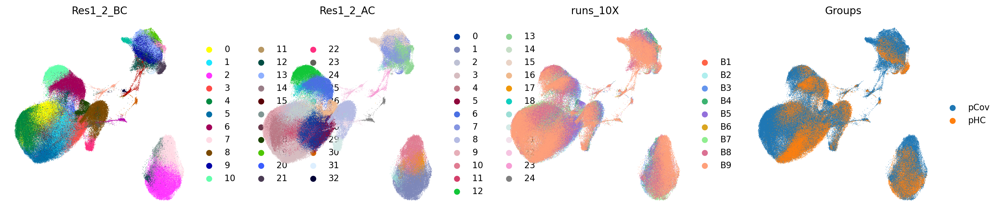

In [65]:
matplotlib.style.use('default')   
rcParams['figure.figsize'] = (4,4)

genes=['Res1_2_BC','Res1_2_AC','runs_10X','Groups']

sc.pl.umap(corrected, 
           color=genes,
           size=1, 
           color_map='OrRd',
           ncols=4,
           frameon=False)

In [80]:
matplotlib.style.use('default') 


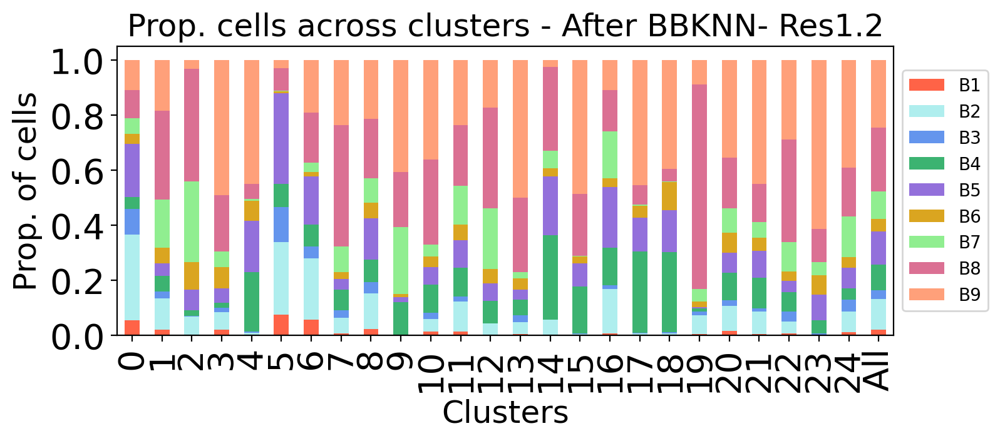

In [81]:
#-- proportion table
Groups_tab = pd.crosstab(index=corrected.obs['Res1_2_AC'],  # Make a crosstab
                        columns=corrected.obs['runs_10X'], margins=True)  

MyTab= Groups_tab.div(Groups_tab["All"], axis=0)
MyTab2 = MyTab.drop(columns="All")

MyTab2.plot(kind="bar",
            figsize=(8,3),
            stacked=True, 
            linewidth=1, 
            width=0.5, 
            fontsize=20, 
            color=col_ids)


plt.title("Prop. cells across clusters - After BBKNN- Res1.2", fontsize=18)
plt.ylabel("Prop. of cells", fontsize=18)
plt.xlabel("Clusters", fontsize=18)
plt.ylim=1.0

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=10)
plt.show()

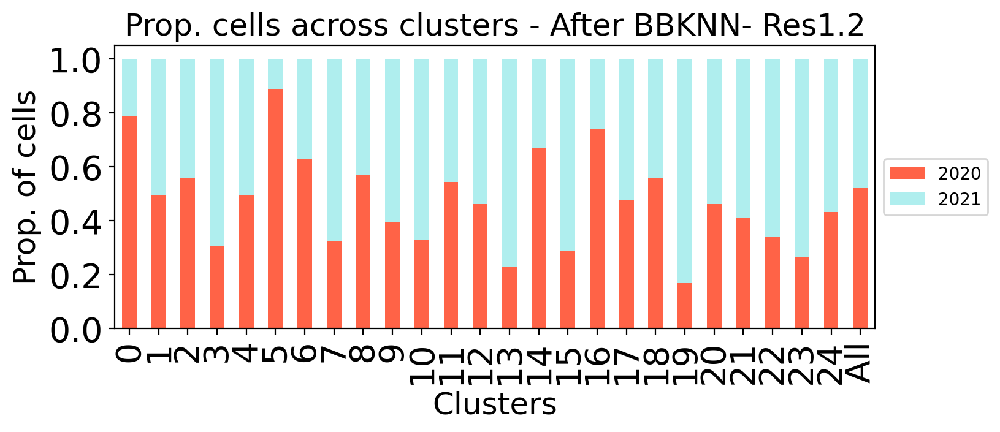

In [67]:
#-- proportion table
Groups_tab = pd.crosstab(index=corrected.obs['Res1_2_AC'],  # Make a crosstab
                        columns=corrected.obs['Year'], margins=True)  

MyTab= Groups_tab.div(Groups_tab["All"], axis=0)
MyTab2 = MyTab.drop(columns="All")

MyTab2.plot(kind="bar",
            figsize=(8,3),
            stacked=True, 
            linewidth=1, 
            width=0.5, 
            fontsize=20, 
            color=col_ids)


plt.title("Prop. cells across clusters - After BBKNN- Res1.2", fontsize=18)
plt.ylabel("Prop. of cells", fontsize=18)
plt.xlabel("Clusters", fontsize=18)
plt.ylim=1.0

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=10)
plt.show()

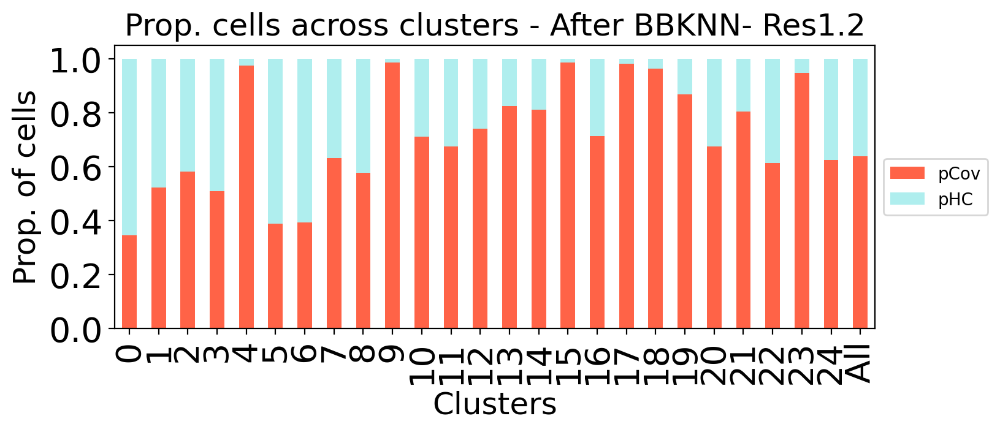

In [68]:
#-- proportion table
Groups_tab = pd.crosstab(index=corrected.obs['Res1_2_AC'],  # Make a crosstab
                        columns=corrected.obs['Groups'], margins=True)  

MyTab= Groups_tab.div(Groups_tab["All"], axis=0)
MyTab2 = MyTab.drop(columns="All")

MyTab2.plot(kind="bar",
            figsize=(8,3),
            stacked=True, 
            linewidth=1, 
            width=0.5, 
            fontsize=20, 
            color=col_ids)


plt.title("Prop. cells across clusters - After BBKNN- Res1.2", fontsize=18)
plt.ylabel("Prop. of cells", fontsize=18)
plt.xlabel("Clusters", fontsize=18)
plt.ylim=1.0

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=10)
plt.show()

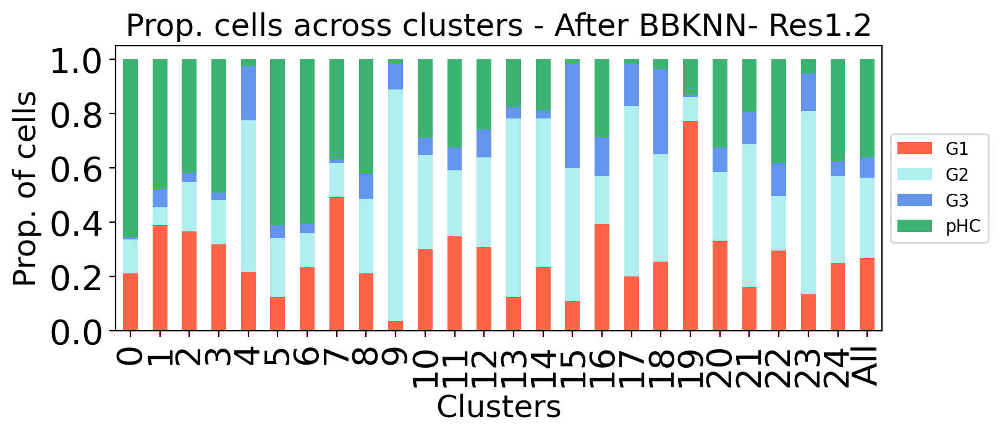

In [82]:
#-- proportion table
Groups_tab = pd.crosstab(index=corrected.obs['Res1_2_AC'],  # Make a crosstab
                        columns=corrected.obs['Patient_groups'], margins=True)  

MyTab= Groups_tab.div(Groups_tab["All"], axis=0)
MyTab2 = MyTab.drop(columns="All")

MyTab2.plot(kind="bar",
            figsize=(8,3),
            stacked=True, 
            linewidth=1, 
            width=0.5, 
            fontsize=20, 
            color=col_ids)


plt.title("Prop. cells across clusters - After BBKNN- Res1.2", fontsize=18)
plt.ylabel("Prop. of cells", fontsize=18)
plt.xlabel("Clusters", fontsize=18)
plt.ylim=1.0

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=10)
plt.show()

/home/nehard/anaconda3/envs/scanpy1_6/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


categories: 0, 1, 2, etc.
var_group_labels: Mgk, Mono, DCs, etc.


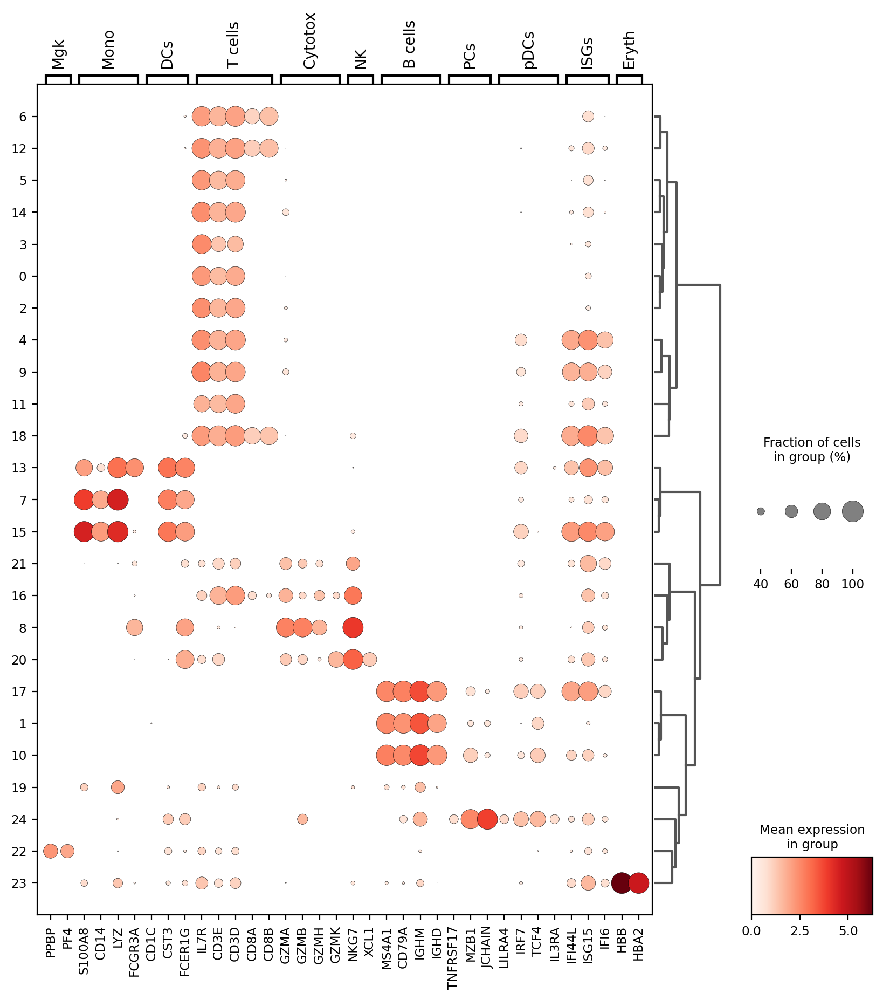

In [69]:
sc.settings.set_figure_params(dpi=300)  # set sufficiently high resolution for saving

Genes =["PPBP","PF4", #mgk: 0-1
        "S100A8","CD14","LYZ","FCGR3A",#2-5
        'CD1C',"CST3","FCER1G", #6-8
        "IL7R","CD3E","CD3D","CD8A","CD8B", #9-13
        "GZMA","GZMB","GZMH","GZMK",
        "NKG7",'XCL1', #18-19
        "MS4A1", "CD79A", "IGHM","IGHD", #20-23
        "TNFRSF17", "MZB1",'JCHAIN',#24-26
        'LILRA4',"IRF7","TCF4","IL3RA", # 27-30
        'IFI44L','ISG15','IFI6','HBB','HBA2'] #31-33

matplotlib.style.use('default') 
ax = sc.pl.dotplot(corrected, 
                   Genes, 
                   'Res1_2_AC', 
                   dendrogram=True,  
                   var_group_positions=[(0,1),(2,5), (6,8),(9,13),(14,17),(18,19),(20,23),(24,26),(27,30),(31,33),(34,35)],
                   var_group_labels=['Mgk','Mono', 'DCs','T cells','Cytotox','NK','B cells','PCs','pDCs','ISGs','Eryth'], 
                   figsize=(10,10),
                    dot_max=1, 
                   dot_min=0.2) #, save='_Fig1c.pdf'
                    #,key='rank_genes_groups_filtered'

In [70]:
corrected

AnnData object with n_obs × n_vars = 256766 × 1362
    obs: 'Cells', 'Samples', 'IDs', 'Names', 'Fig_ids', 'Groups', 'Ethnicity', 'Age_Months', 'runs_10X', 'Year', 'Patient_groups', 'doublet_score', 'predicted_doublets_1', 'n_genes', 'percent_mito', 'n_counts', 'Res1_2_BC', 'Res1_2_AC'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'Res1_2_BC_colors', 'runs_10X_colors', 'Year_colors', 'Res1_2_AC_colors', 'Groups_colors', "dendrogram_['Res1_2_AC']"
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [71]:
corrected.uns['Res1_2_AC_colors']=col_ids

/home/nehard/anaconda3/envs/scanpy1_6/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


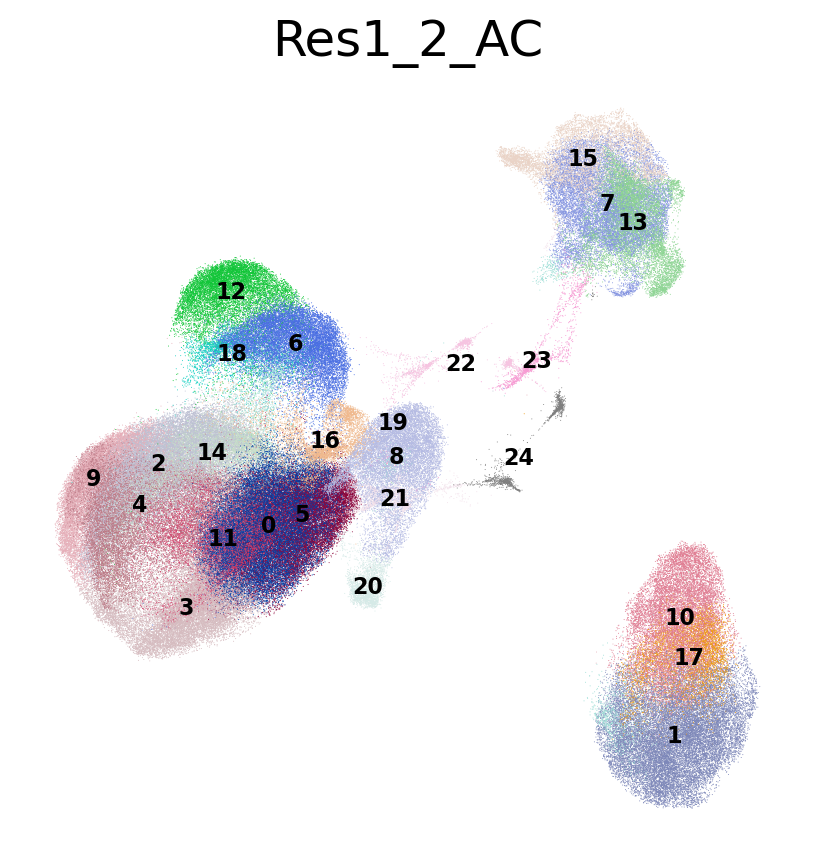

In [83]:
matplotlib.style.use('default')  
rcParams['figure.figsize'] = (5,5)

plt.rc('font', size=15)          # controls default text sizes
plt.rc('legend', fontsize=20)    # legend fontsize


sc.pl.umap(corrected, 
           color=['Res1_2_AC'], 
           color_map='OrRd',
           size=0.5, #***
           ncols=3,
           frameon=False,
           legend_loc='on data',
           legend_fontsize=8)

# Finding marker genes


In [73]:
sc.tl.rank_genes_groups(corrected, 'Res1_2_AC', method='t-test')


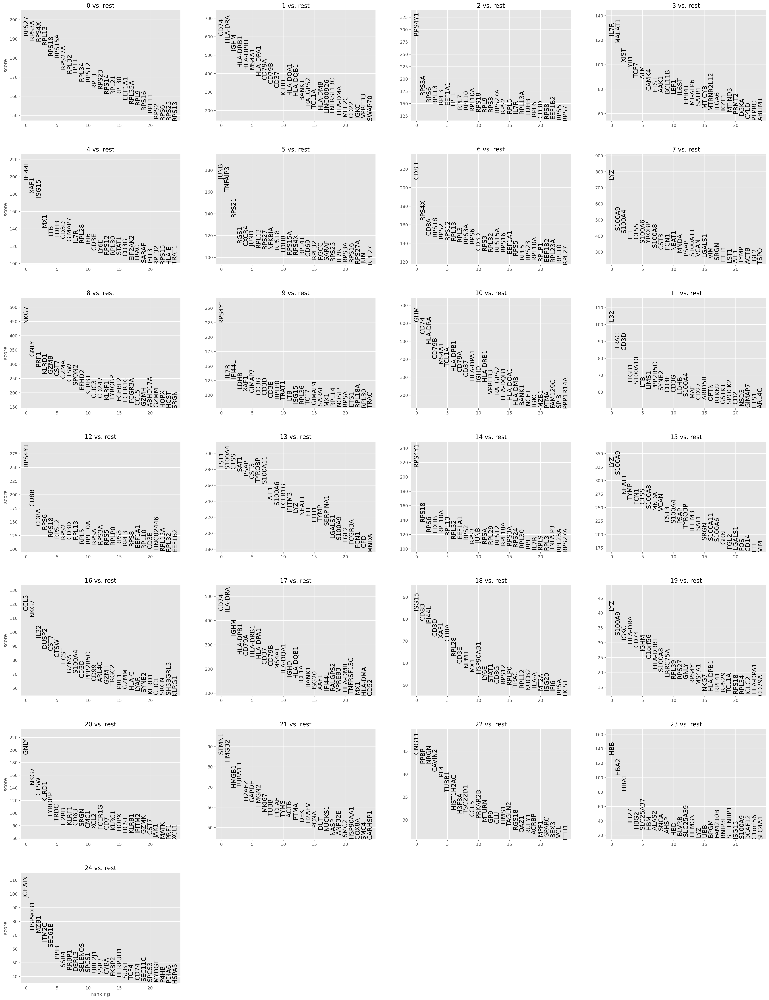

In [74]:
#-- Finding marker genes
matplotlib.style.use('ggplot') 
rcParams['figure.figsize'] = (8,6)
sc.pl.rank_genes_groups(corrected, n_genes=25, sharey=False,fontsize=15)

# save data 

In [84]:
#--- Umap embbedings 
Emb =corrected.obsm.to_df()[['X_umap1', 'X_umap2']]
Emb.index =corrected.obs.index

#-- Meta Data 
meta =corrected.obs
Mat = meta.join(Emb)

Mat.to_csv('../Meta/Meta_pCov40_bbknn_13042021.csv')
corrected.write('../H5AD/pCov40_bbknn_13042021.h5ad')


In [11]:
#-- -colors for DCs
col_ids =['tomato','paleturquoise','cornflowerblue','mediumseagreen','mediumpurple',
          'goldenrod','lightgreen','palevioletred','lightsalmon','thistle', #0-9
          "brown","plum","lightskyblue","yellowgreen","mediumorchid","mediumturquoise","peru",
          "#bf812d","mediumaquamarine","lightslategrey","dodgerblue","#4daf4a",'#377eb8']

col_groups=["#9e9ac8","#66c2a4"]

# 1- BBKNN

In [3]:
bbknn_cor =sc.read('../H5AD/pCov40_bbknn_13042021.h5ad')
bbknn_cor

AnnData object with n_obs × n_vars = 256766 × 1362
    obs: 'Cells', 'Samples', 'IDs', 'Names', 'Fig_ids', 'Groups', 'Ethnicity', 'Age_Months', 'runs_10X', 'Year', 'Patient_groups', 'doublet_score', 'predicted_doublets_1', 'n_genes', 'percent_mito', 'n_counts', 'Res1_2_BC', 'Res1_2_AC', 'Fig_ids_Groups', 'annotated_clusters', 'ISG_score_raw', 'ISG_score', 'INFLAM_score_raw', 'INFLAM_score'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'annotated_clusters_colors', "dendrogram_['annotated_clusters']", 'dendrogram_annotated_clusters', 'neighbors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'scaled'
    obsp: 'connectivities', 'distances'

In [29]:
bbknn_cor.uns['Res1_2_AC']=col_ids


/home/nehard/anaconda3/envs/scanpy1_6/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


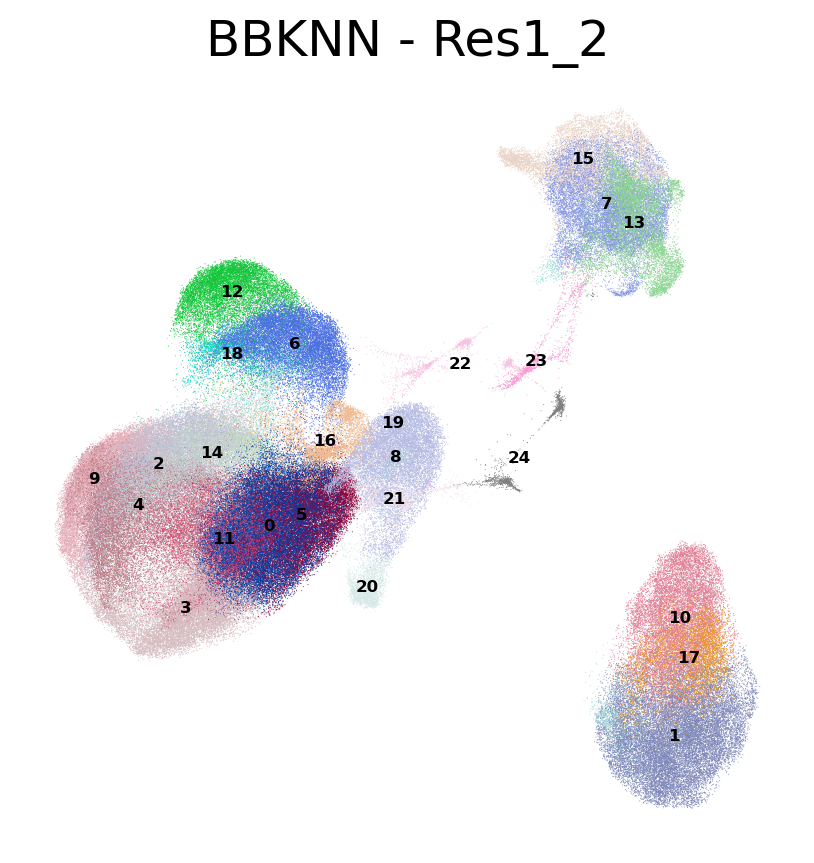

In [32]:
matplotlib.style.use('default')  
rcParams['figure.figsize'] = (5,5)

plt.rc('font', size=15)          # controls default text sizes
plt.rc('legend', fontsize=20)    # legend fontsize


sc.pl.umap(bbknn_cor, 
           color=['Res1_2_AC'], 
           color_map='OrRd',
           size=0.5, #***
           ncols=2,
           frameon=False,
           legend_loc='on data',
           legend_fontsize=6, title='BBKNN - Res1_2')
          # save='_LS90_LegendsOnData.pdf')


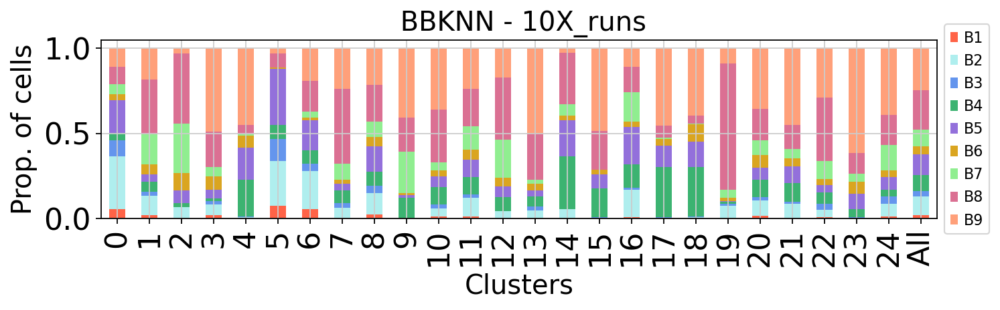

In [14]:
#-- proportion table
Groups_tab = pd.crosstab(index=bbknn_cor.obs['Res1_2_AC'],  # Make a crosstab
                        columns=bbknn_cor.obs['runs_10X'], margins=True)  

MyTab= Groups_tab.div(Groups_tab["All"], axis=0)
MyTab2 = MyTab.drop(columns="All")

MyTab2.plot(kind="bar",
            figsize=(10,2.2),
            stacked=True, 
            linewidth=1, 
            width=0.5, 
            fontsize=20, 
            color=col_ids)


plt.title(" BBKNN - 10X_runs", fontsize=18)
plt.ylabel("Prop. of cells", fontsize=18)
plt.xlabel("Clusters", fontsize=18)
plt.ylim=1.0

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=10)
plt.show()


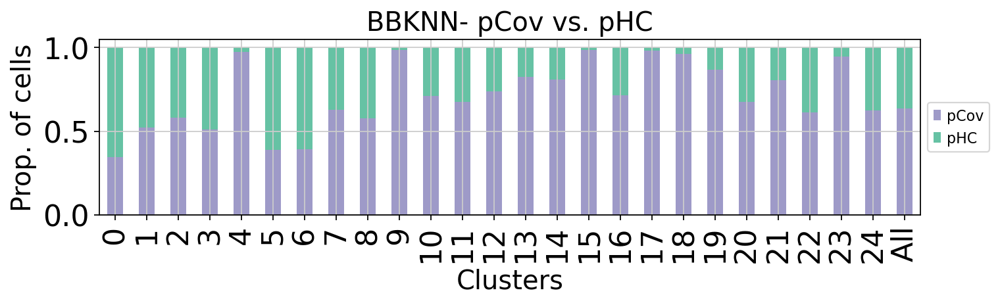

In [15]:
#-- proportion table
Groups_tab = pd.crosstab(index=bbknn_cor.obs['Res1_2_AC'],  # Make a crosstab
                        columns=bbknn_cor.obs['Groups'], margins=True)  

MyTab= Groups_tab.div(Groups_tab["All"], axis=0)
MyTab2 = MyTab.drop(columns="All")

MyTab2.plot(kind="bar",
            figsize=(10,2.2),
            stacked=True, 
            linewidth=1, 
            width=0.5, 
            fontsize=20, 
            color=col_groups)


plt.title("BBKNN- pCov vs. pHC", fontsize=18)
plt.ylabel("Prop. of cells", fontsize=18)
plt.xlabel("Clusters", fontsize=18)
plt.ylim=1.0

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=10)
plt.show()


/home/nehard/anaconda3/envs/scanpy1_6/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


categories: 0, 1, 2, etc.
var_group_labels: Mgk, Mono, DCs, etc.


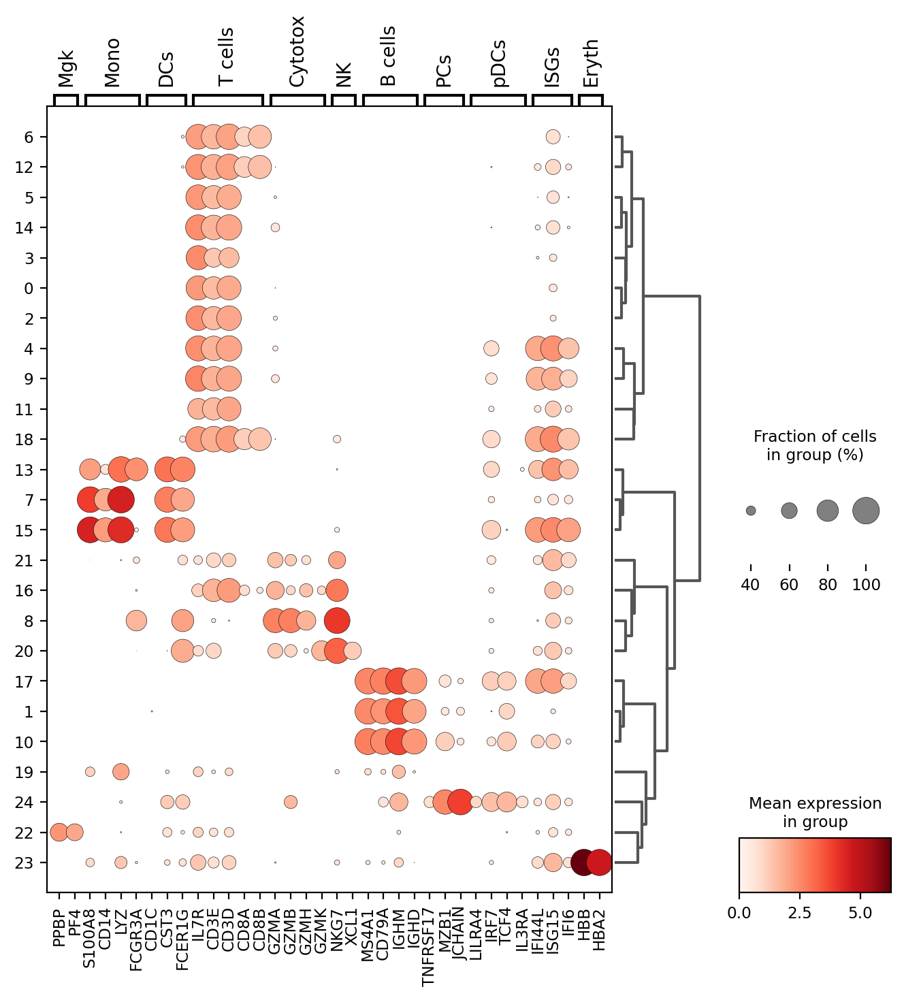

In [36]:
sc.settings.set_figure_params(dpi=300)  # set sufficiently high resolution for saving

Genes =["PPBP","PF4", #mgk: 0-1
        "S100A8","CD14","LYZ","FCGR3A",#2-5
        'CD1C',"CST3","FCER1G", #6-8
        "IL7R","CD3E","CD3D","CD8A","CD8B", #9-13
        "GZMA","GZMB","GZMH","GZMK",
        "NKG7",'XCL1', #18-19
        "MS4A1", "CD79A", "IGHM","IGHD", #20-23
        "TNFRSF17", "MZB1",'JCHAIN',#24-26
        'LILRA4',"IRF7","TCF4","IL3RA", # 27-30
        'IFI44L','ISG15','IFI6','HBB','HBA2'] #31-33

matplotlib.style.use('default') 
ax = sc.pl.dotplot(bbknn_cor, 
                   Genes, 
                   'Res1_2_AC', 
                   dendrogram=True,  
                   var_group_positions=[(0,1),(2,5), (6,8),(9,13),(14,17),(18,19),(20,23),(24,26),(27,30),(31,33),(34,35)],
                   var_group_labels=['Mgk','Mono', 'DCs','T cells','Cytotox','NK','B cells','PCs','pDCs','ISGs','Eryth'], 
                   figsize=(8,7.5),
                    dot_max=1, 
                   dot_min=0.2) #, save='_Fig1c.pdf'
                    #,key='rank_genes_groups_filtered'